In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import anndata as ad

plt.rcParams['figure.figsize'] = (15, 15)
from scipy.stats import median_abs_deviation

# feature selection
#import anndata2ri
#import logging
#import rpy2.rinterface_lib.callbacks as rcb
#import rpy2.robjects as ro

sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    frameon=False,
)

# Raw data processing 
### Read count file and create anndata object

In [2]:
counts = pd.read_csv('/home/p/pohll/Desktop/MP/data/xie/GSE104154_d0_d21_sma_tm_Expr_raw.csv', index_col='id')

In [3]:
counts.head()

,symbol,AAACCTGAGGACATTA-1,AAACCTGCAGTCGTGC-1,AAACCTGCATGAAGTA-1,AAACCTGTCTCGCATC-1,AAACGGGTCCTAGAAC-1,AAACGGGTCTAAGCCA-1,AAAGCAAAGGACTGGT-1,AAAGCAAGTAGGCATG-1,AAAGCAAGTGTTGAGG-1,...,TTGTAGGCAAAGCAAT-6,TTGTAGGGTCAATACC-6,TTGTAGGTCCCATTTA-6,TTTACTGCAACACCTA-6,TTTACTGTCTGGCGAC-6,TTTCCTCGTTTAGGAA-6,TTTGCGCCAATGAAAC-6,TTTGGTTCAGTAGAGC-6,TTTGTCAAGCTACCGC-6,TTTGTCACATCGGGTC-6
id,,,,,,,,,,,,,,,,,,,,,
ENSMUSG00000051951,Xkr4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ENSMUSG00000089699,Gm1992,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ENSMUSG00000102343,Gm37381,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ENSMUSG00000025900,Rp1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ENSMUSG00000109048,Rp1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
counts.shape

(27998, 10411)

In [5]:
counts.index = counts.symbol
counts = counts.drop('symbol', axis=1)

In [6]:
xie_csv = ad.AnnData(counts)

/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [7]:
xie_csv.obs_names_make_unique()

In [8]:
xie_csv = xie_csv.T

In [9]:
xie_csv

AnnData object with n_obs × n_vars = 10410 × 27998

10411 barcodes (cells, obs), 27998 genes (vars)

In [10]:
anno_ctrl = pd.read_excel('/home/p/pohll/Desktop/MP/data/xie/GSE104154_cell_type_annotation_d0_d21.xlsx', sheet_name=1, index_col='Barcode')
anno_bleo = pd.read_excel('/home/p/pohll/Desktop/MP/data/xie/GSE104154_cell_type_annotation_d0_d21.xlsx', sheet_name=2, index_col='Barcode')

In [11]:
anno_ctrl["defined"].unique()

array(['Col13a1', 'Myofibroblasts', 'Lipofibroblasts', 'Col14a1',
       'Endothelial', 'Methothelial', 'Mesprogenitors'], dtype=object)

In [12]:
anno_xie = pd.concat([anno_ctrl, anno_bleo])

In [13]:
anno_xie.head()

,defined
Barcode,
AAACCTGAGGACATTA.1,Col13a1
AAACCTGCAGTCGTGC.1,Myofibroblasts
AAACCTGCATGAAGTA.1,Lipofibroblasts
AAACCTGTCTCGCATC.1,Myofibroblasts
AAACGGGTCCTAGAAC.1,Myofibroblasts


In [14]:
anno_xie.index = anno_xie.index.str.replace(pat='.', repl='-')

In [15]:
xie_csv.obs['annotation']=anno_xie

In [17]:
xie_csv.obs.index

Index(['AAACCTGAGGACATTA-1', 'AAACCTGCAGTCGTGC-1', 'AAACCTGCATGAAGTA-1',
       'AAACCTGTCTCGCATC-1', 'AAACGGGTCCTAGAAC-1', 'AAACGGGTCTAAGCCA-1',
       'AAAGCAAAGGACTGGT-1', 'AAAGCAAGTAGGCATG-1', 'AAAGCAAGTGTTGAGG-1',
       'AAAGCAATCCTCCTAG-1',
       ...
       'TTGTAGGCAAAGCAAT-6', 'TTGTAGGGTCAATACC-6', 'TTGTAGGTCCCATTTA-6',
       'TTTACTGCAACACCTA-6', 'TTTACTGTCTGGCGAC-6', 'TTTCCTCGTTTAGGAA-6',
       'TTTGCGCCAATGAAAC-6', 'TTTGGTTCAGTAGAGC-6', 'TTTGTCAAGCTACCGC-6',
       'TTTGTCACATCGGGTC-6'],
      dtype='object', length=10410)

### show highest expressed genes 

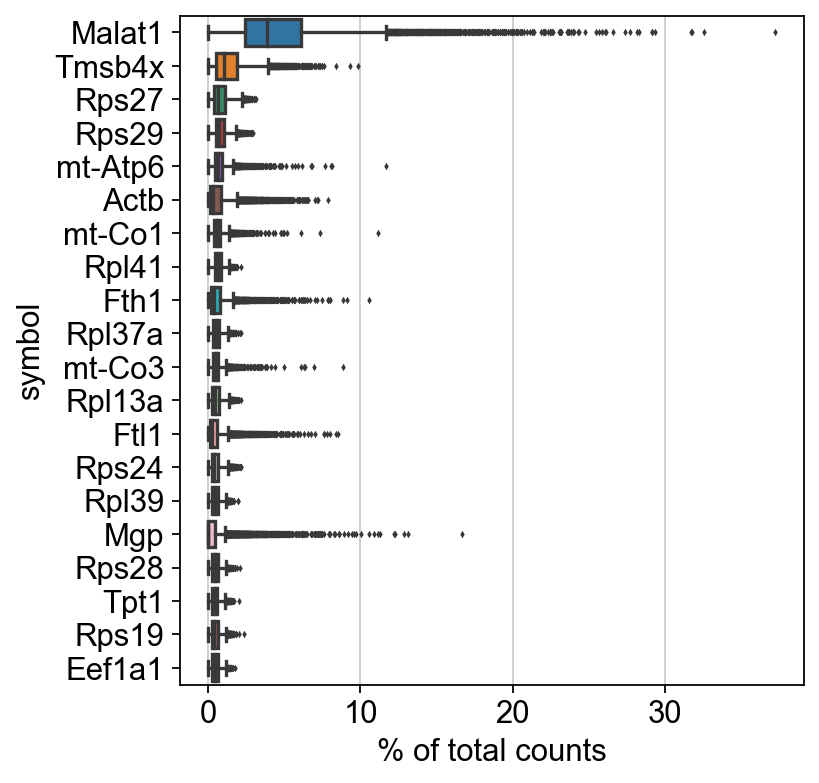

In [18]:
sc.pl.highest_expr_genes(xie_csv, n_top=20)

MALAT1 is the most expressed gene which is frequently detected in poly-A captured scRNA-Seq data, independent of protocol. This gene has been shown to have an inverse correlation with cell health. Especially dead/dying cells have a higher expression of MALAT1.

# Qualitly Control 
for qc split anndata for each sample than merge later 

In [19]:
xie_csv.var_names.str.startswith("MT-").sum()

0

In [20]:
xie_csv.var_names.str.startswith("mt-").sum()

13

In [21]:
xie_csv.var_names

Index(['Xkr4', 'Gm1992', 'Gm37381', 'Rp1', 'Rp1-1', 'Sox17', 'Gm37323',
       'Mrpl15', 'Lypla1', 'Gm37988',
       ...
       'AC125149.1', 'AC125149.2', 'AC125149.4', 'AC234645.1', 'AC168977.2',
       'AC168977.1', 'PISD', 'DHRSX', 'Vmn2r122', 'CAAA01147332.1'],
      dtype='object', name='symbol', length=27998)

In [22]:
# mitochondrial genes
xie_csv.var["mt"] = xie_csv.var_names.str.startswith(("MT-", "mt-"))
# ribosomal genes
xie_csv.var["ribo"] = xie_csv.var_names.str.startswith(("RPS", "RPL", "rps", "rpl"))
# hemoglobin genes.
xie_csv.var["hb"] = xie_csv.var_names.str.contains(("^HB[^(P)]"))

In [24]:
xie_csv.obs.index

Index(['AAACCTGAGGACATTA-1', 'AAACCTGCAGTCGTGC-1', 'AAACCTGCATGAAGTA-1',
       'AAACCTGTCTCGCATC-1', 'AAACGGGTCCTAGAAC-1', 'AAACGGGTCTAAGCCA-1',
       'AAAGCAAAGGACTGGT-1', 'AAAGCAAGTAGGCATG-1', 'AAAGCAAGTGTTGAGG-1',
       'AAAGCAATCCTCCTAG-1',
       ...
       'TTGTAGGCAAAGCAAT-6', 'TTGTAGGGTCAATACC-6', 'TTGTAGGTCCCATTTA-6',
       'TTTACTGCAACACCTA-6', 'TTTACTGTCTGGCGAC-6', 'TTTCCTCGTTTAGGAA-6',
       'TTTGCGCCAATGAAAC-6', 'TTTGGTTCAGTAGAGC-6', 'TTTGTCAAGCTACCGC-6',
       'TTTGTCACATCGGGTC-6'],
      dtype='object', length=10410)

In [23]:
sc.pp.calculate_qc_metrics(
    xie_csv, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=[20], log1p=True
)
xie_csv

AnnData object with n_obs × n_vars = 10410 × 27998
    obs: 'annotation', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

In [24]:
xie_csv

AnnData object with n_obs × n_vars = 10410 × 27998
    obs: 'annotation', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

In [25]:
xie_csv.obs['sample']=xie_csv.obs.index.str.split('-').str[1]

### QC covariates: 
- n_genes_by_counts in .obs is the number of genes with positive counts in a cell,
- total_counts is the total number of counts for a cell, this might also be known as library size, and
- pct_counts_mt is the proportion of total counts for a cell which are mitochondrial.

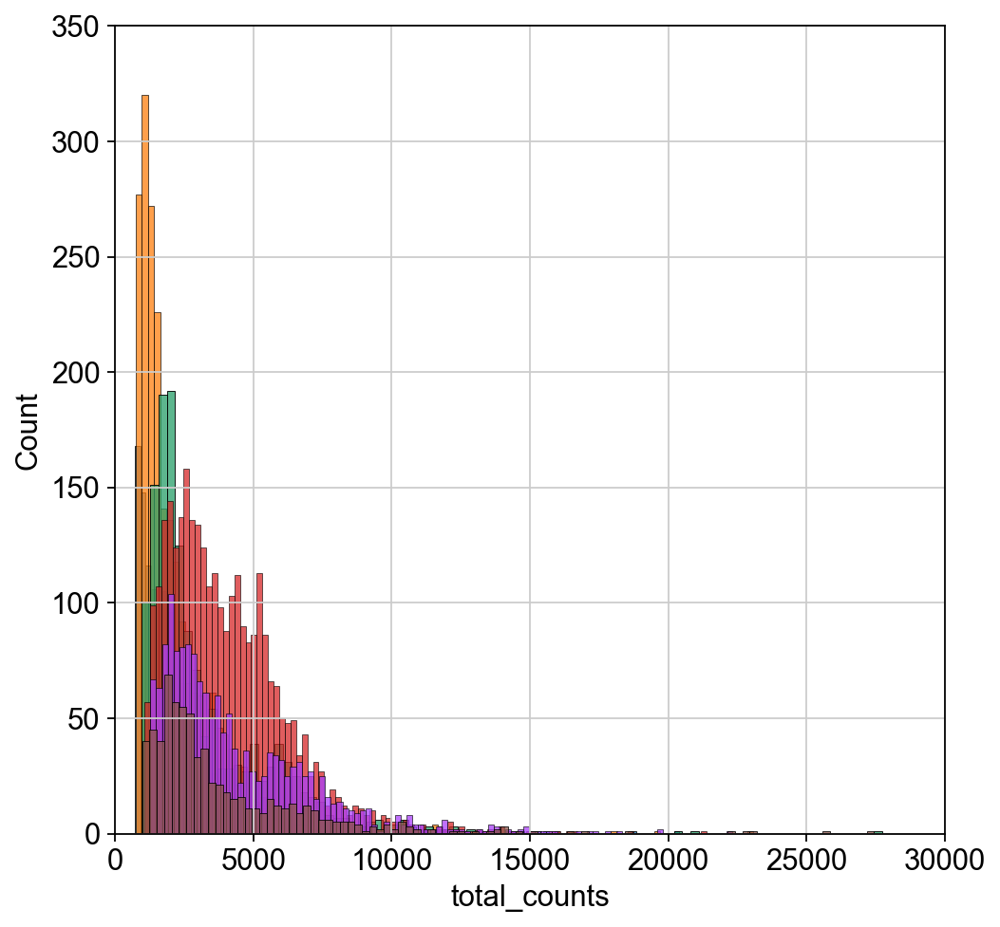

In [26]:
plt.rcParams['figure.figsize'] = (7, 7)
samples = ["-1","-2", "-3","-4","-5","-6"]
for x in samples: 
    subset_xie = xie_csv[xie_csv.obs.index.str.endswith(x)]
    p1 = sns.histplot(subset_xie.obs["total_counts"], bins=100, kde=False, legend = True).set(xlim=(0,30000),ylim=(0,350))



<AxesSubplot: xlabel='total_counts', ylabel='Count'>

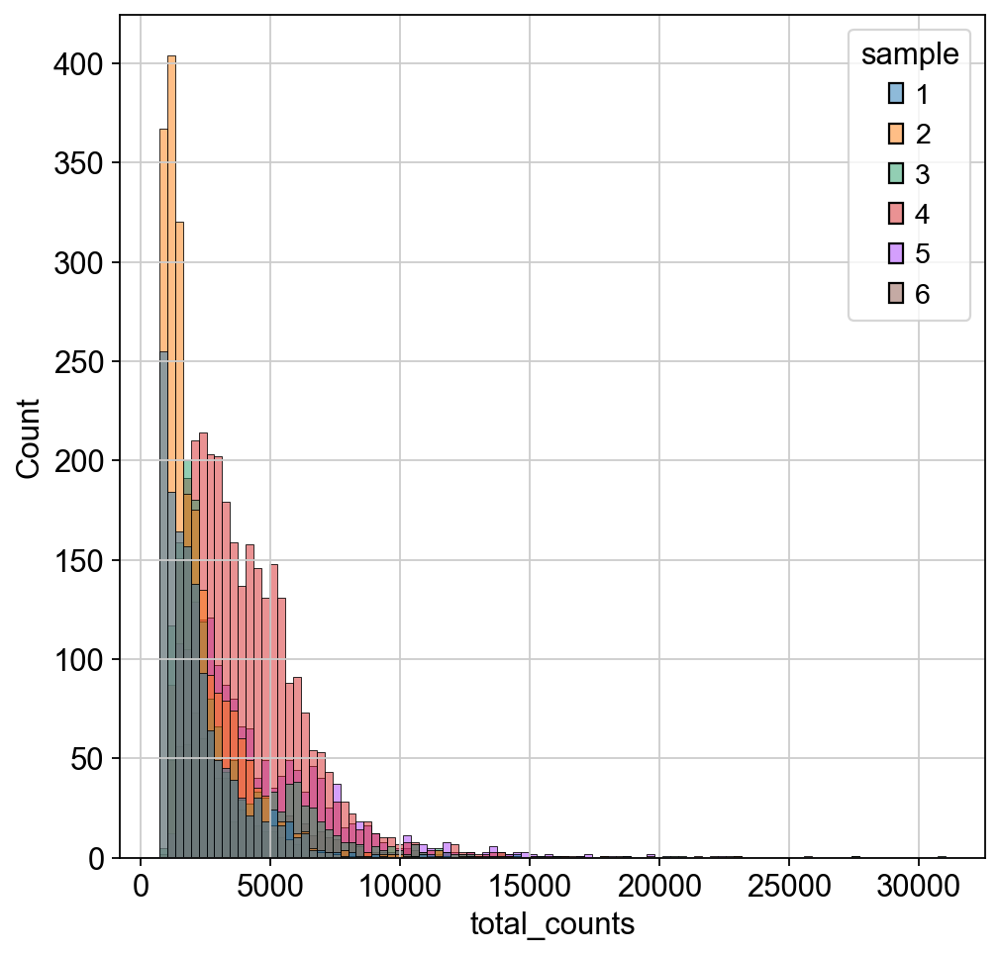

In [27]:
sns.histplot(
    xie_csv.obs, x="total_counts", hue="sample",bins=100, kde=False, legend = True
)

/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


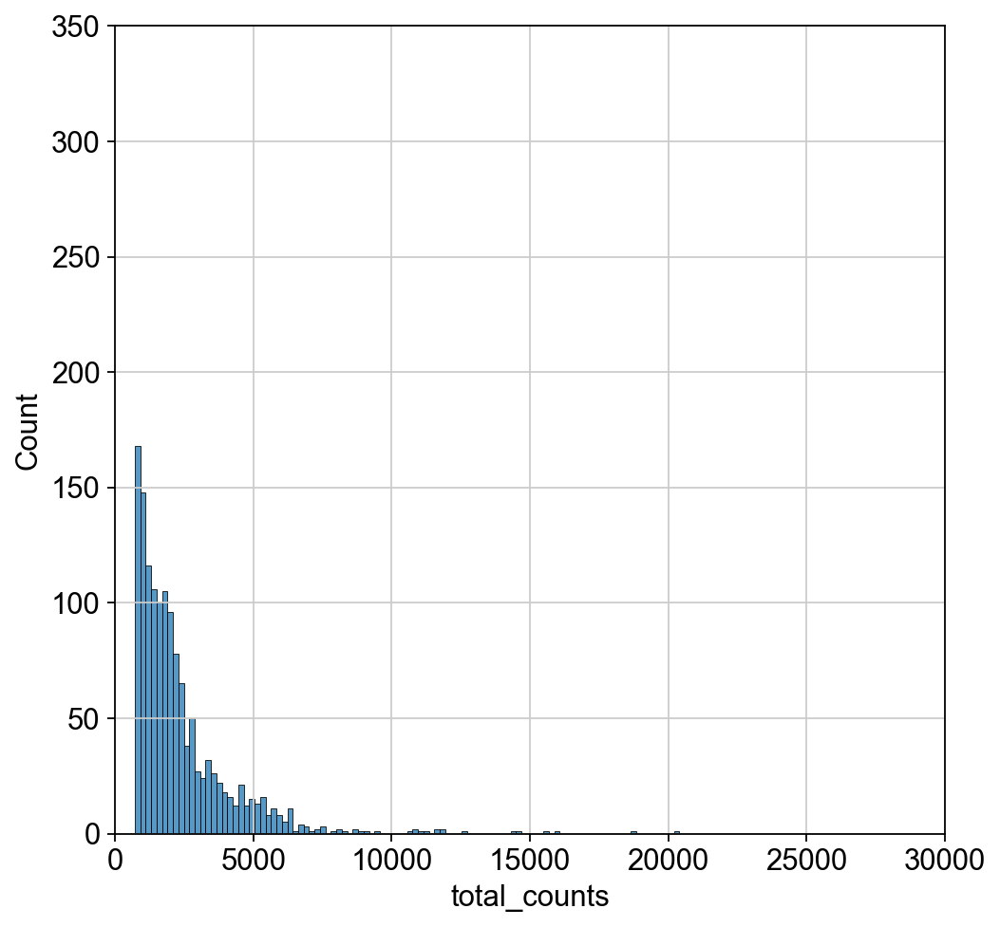

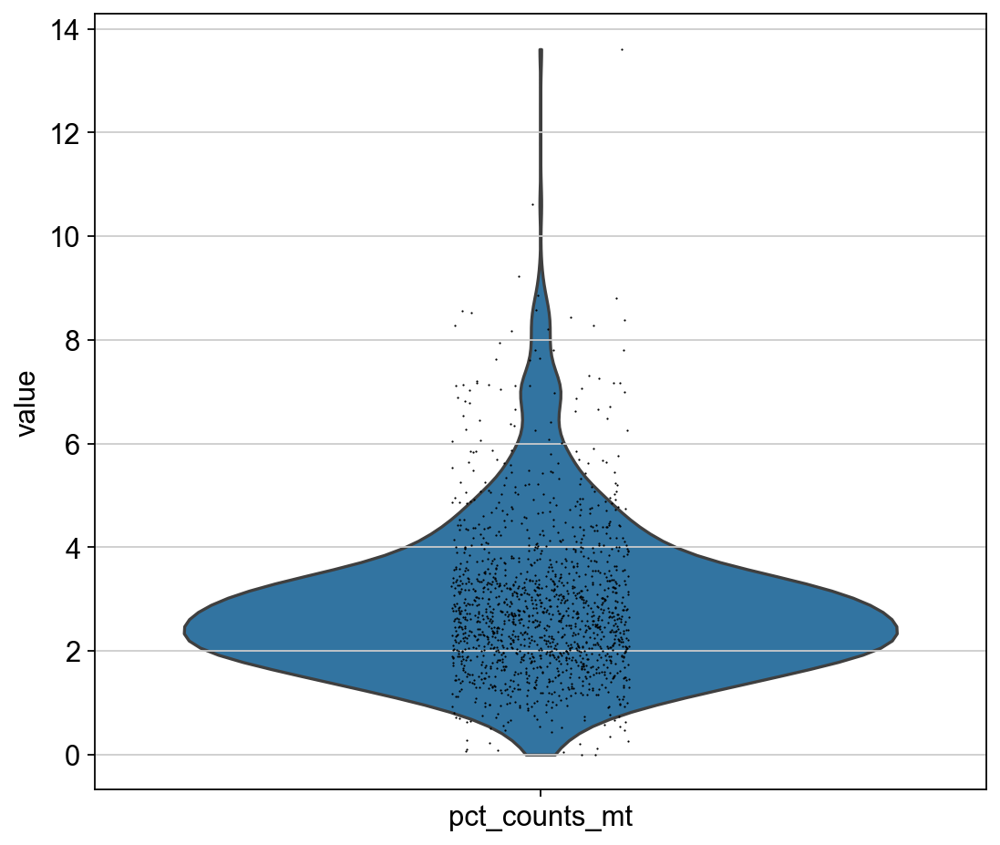

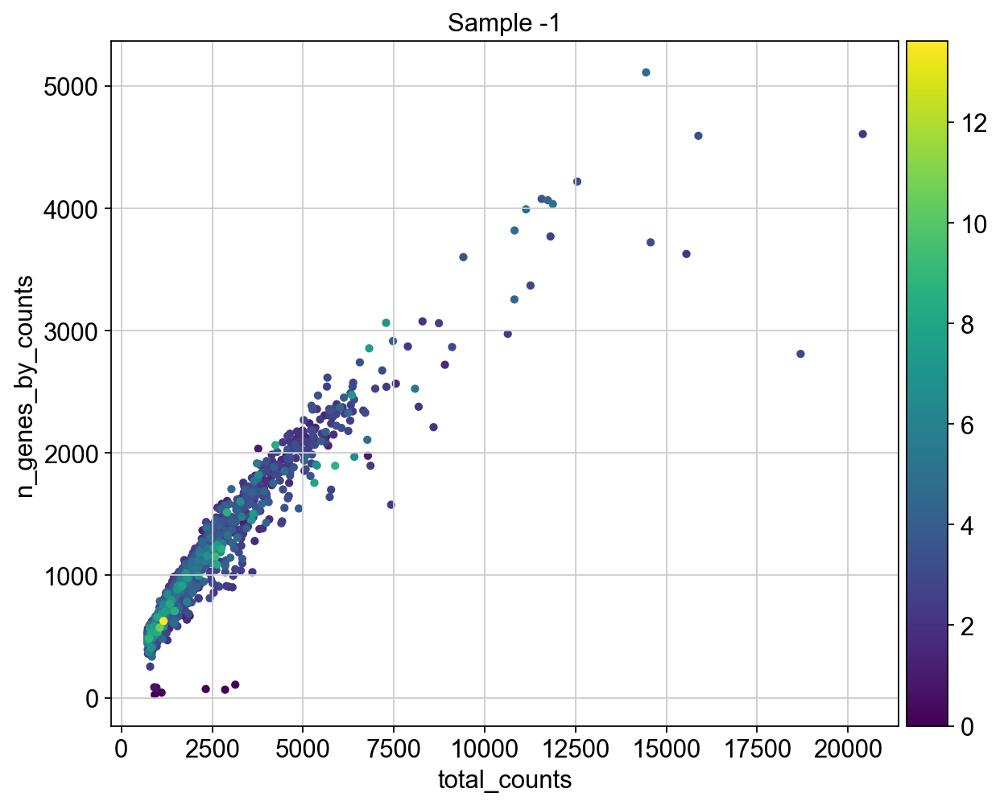

/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


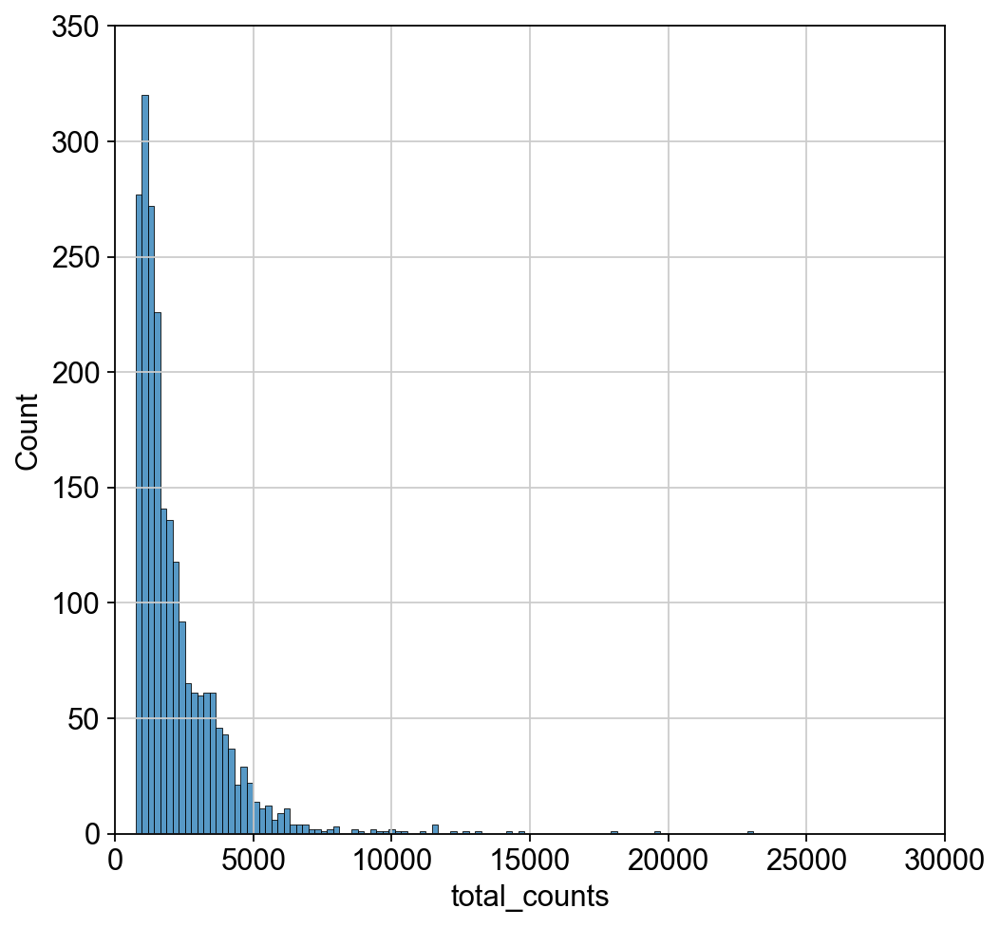

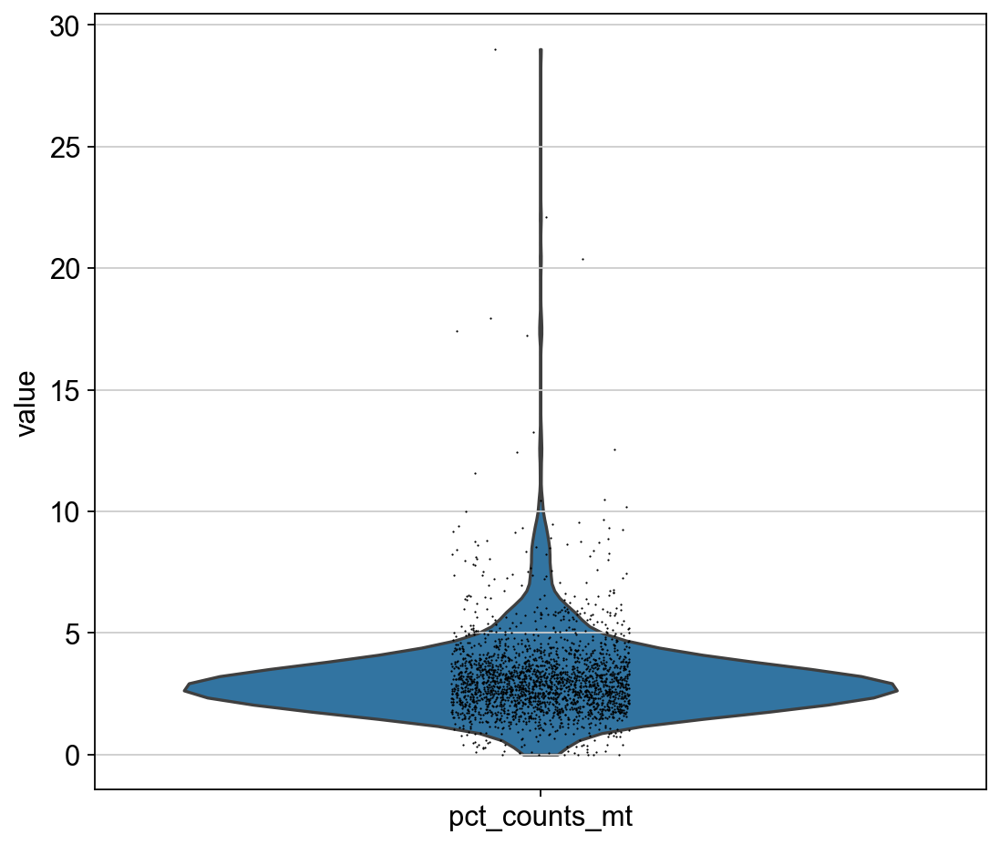

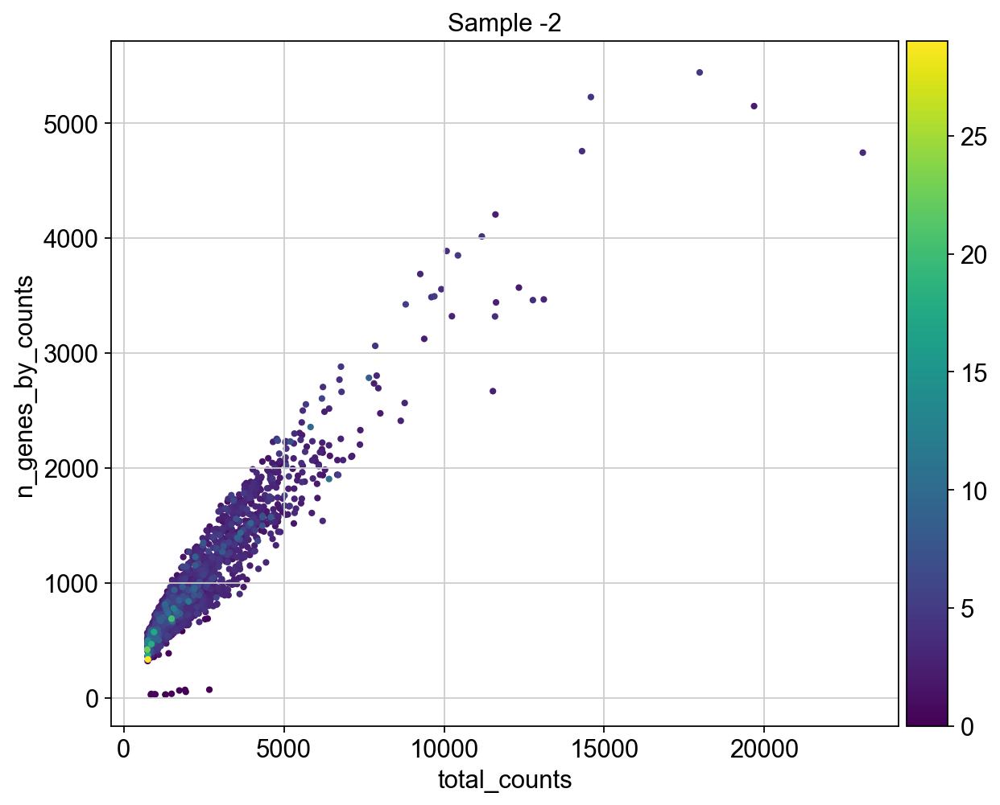

/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


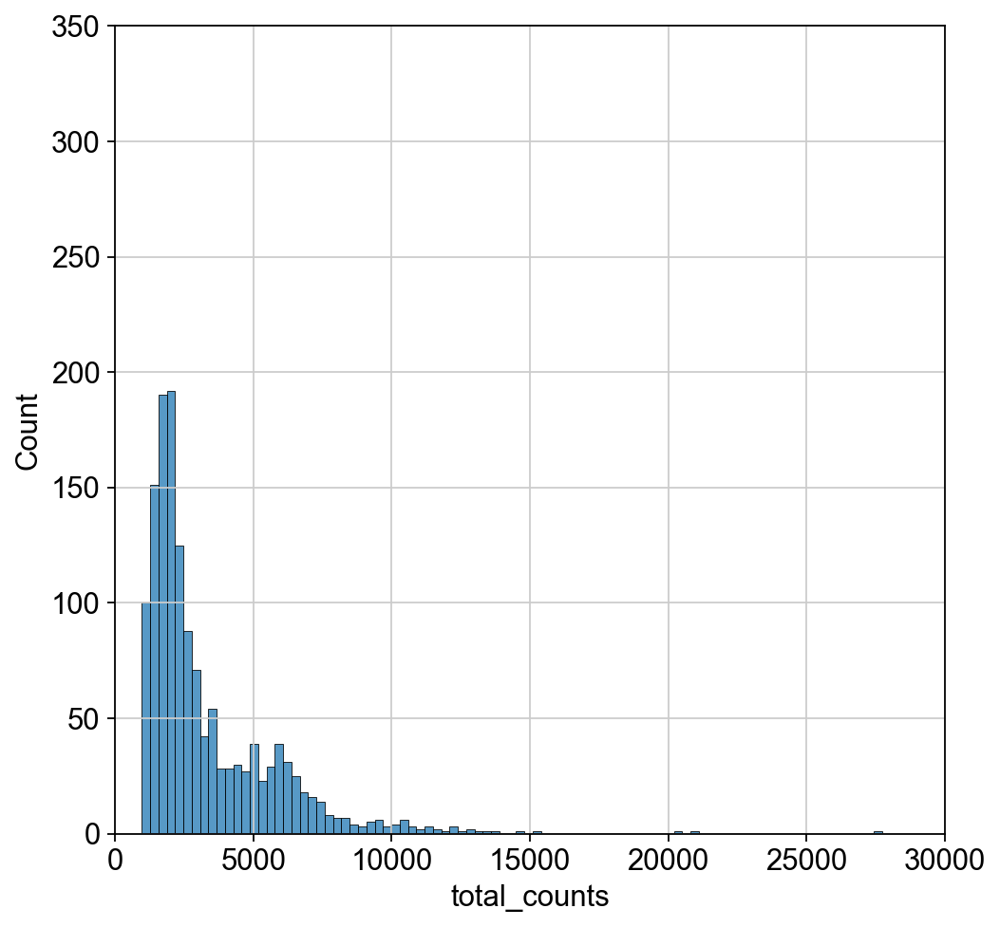

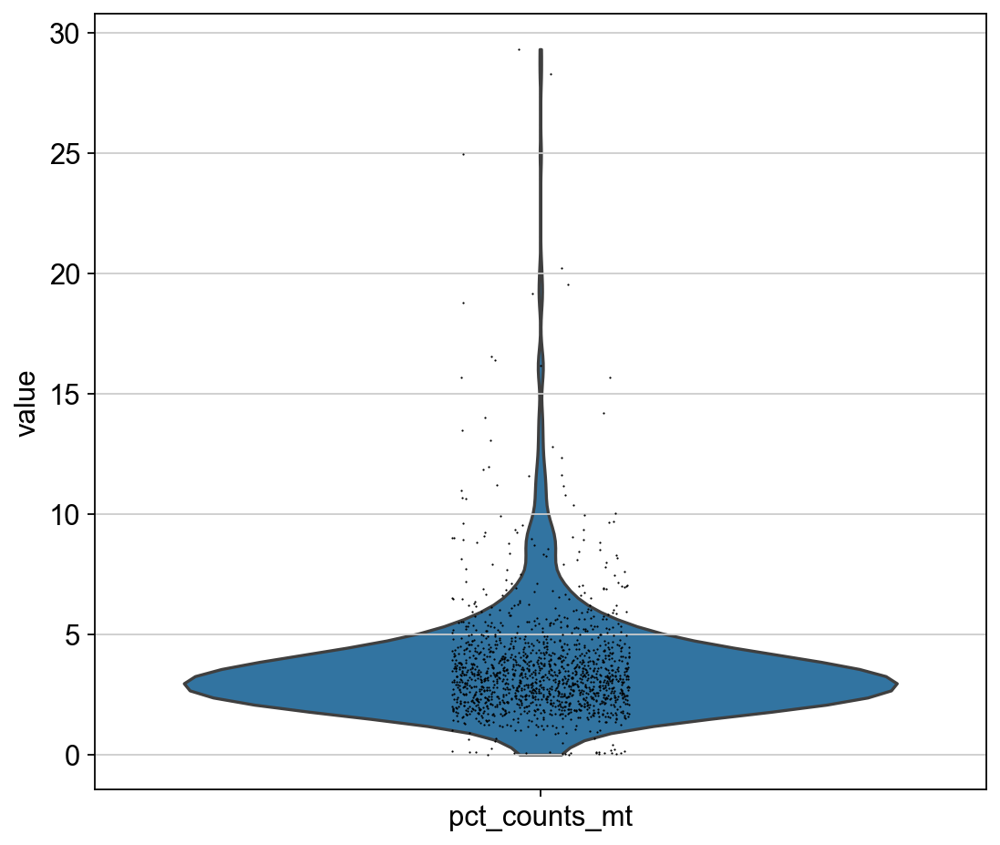

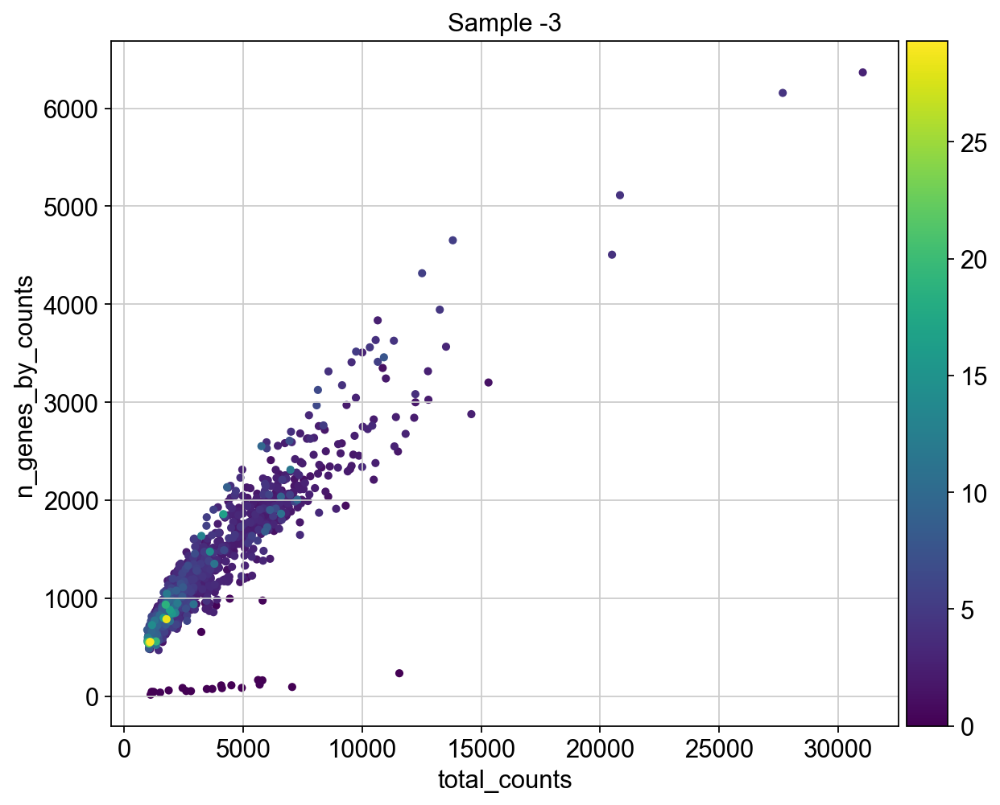

/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


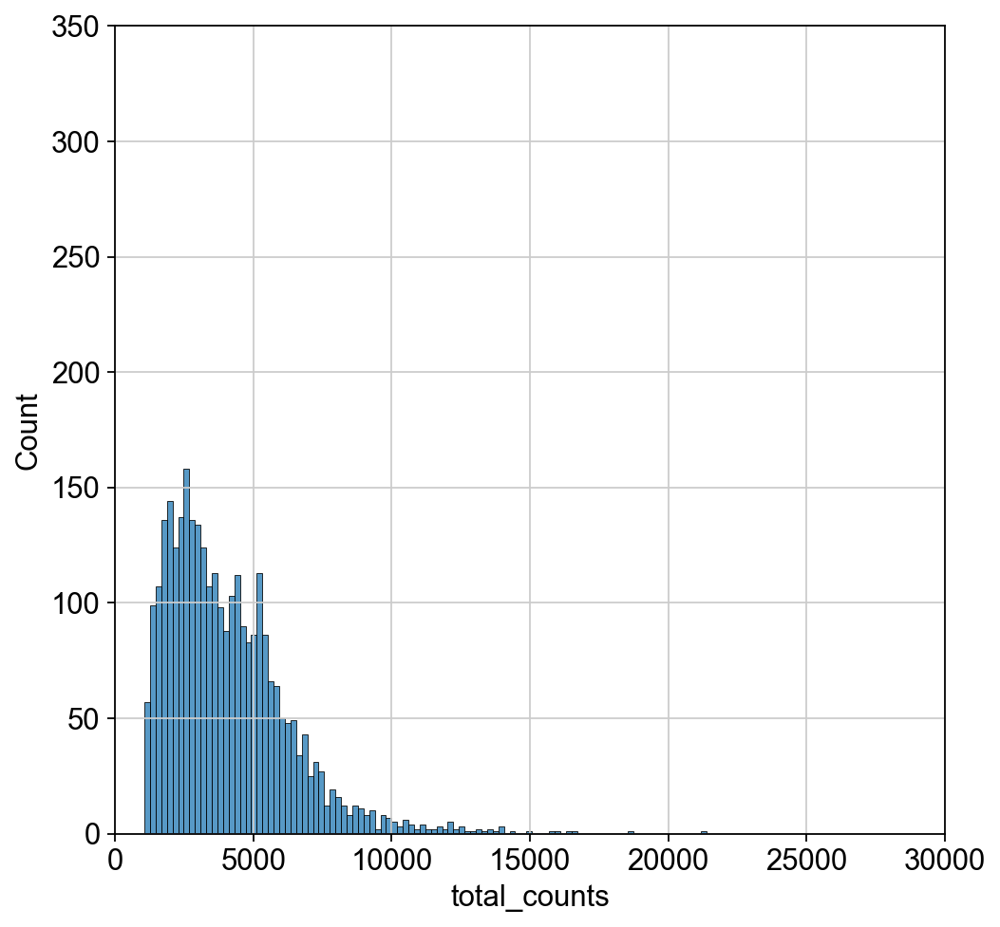

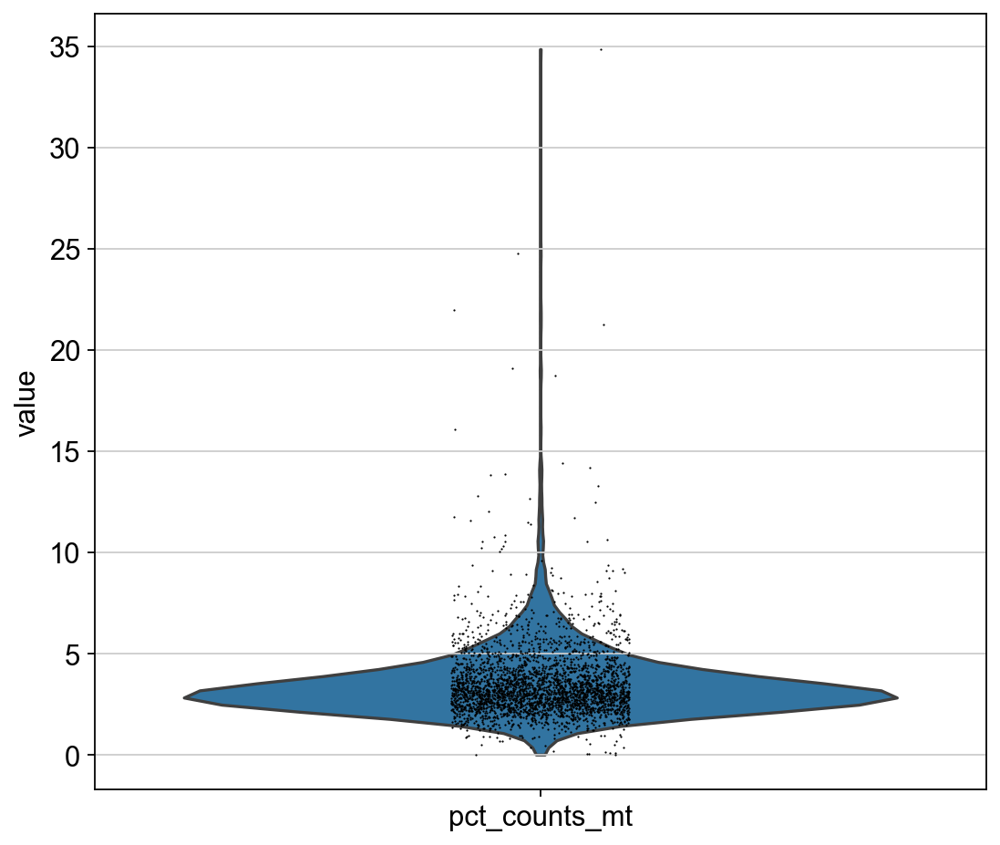

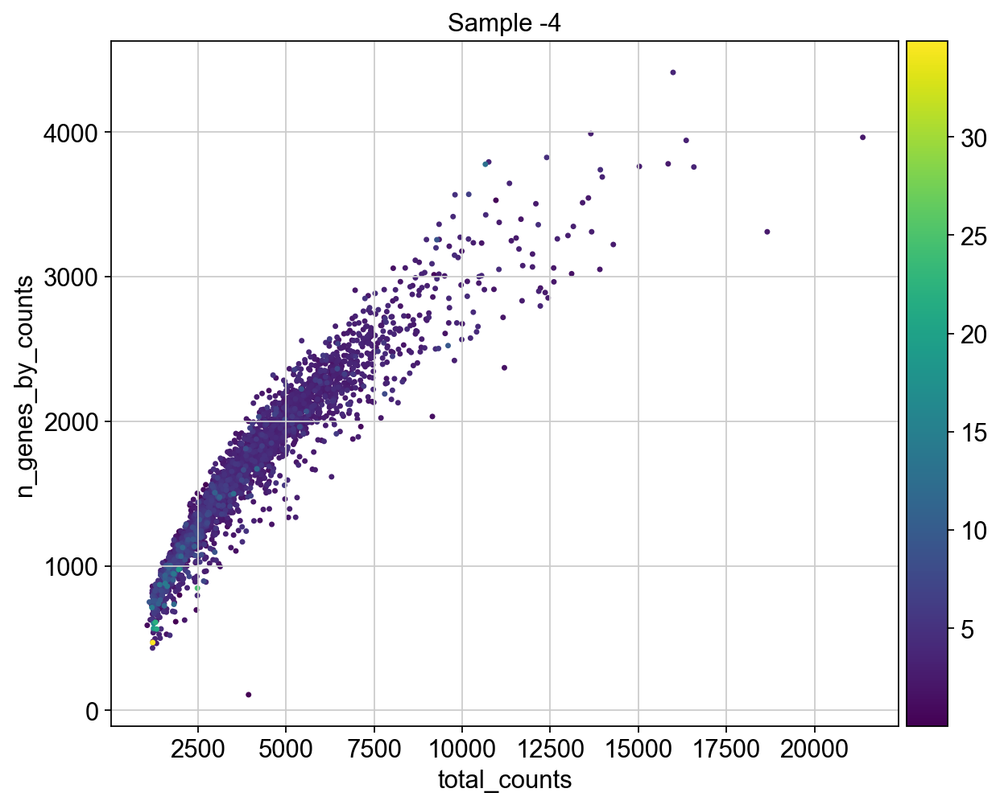

/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


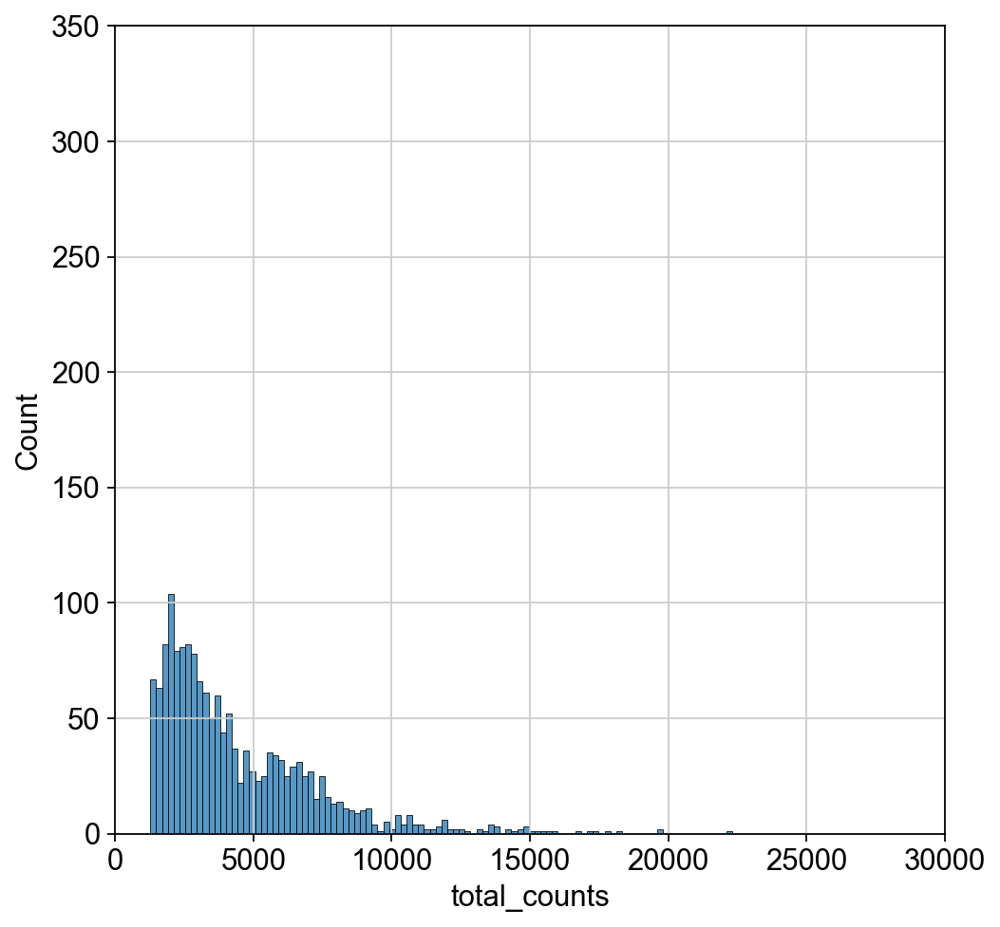

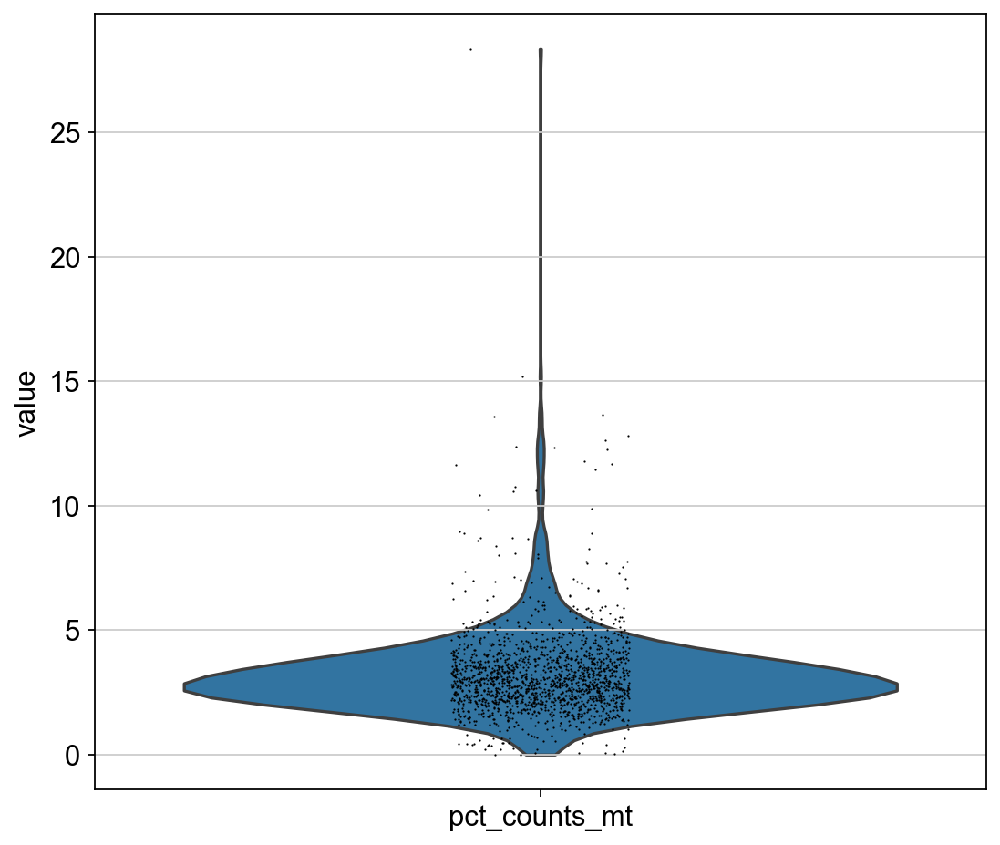

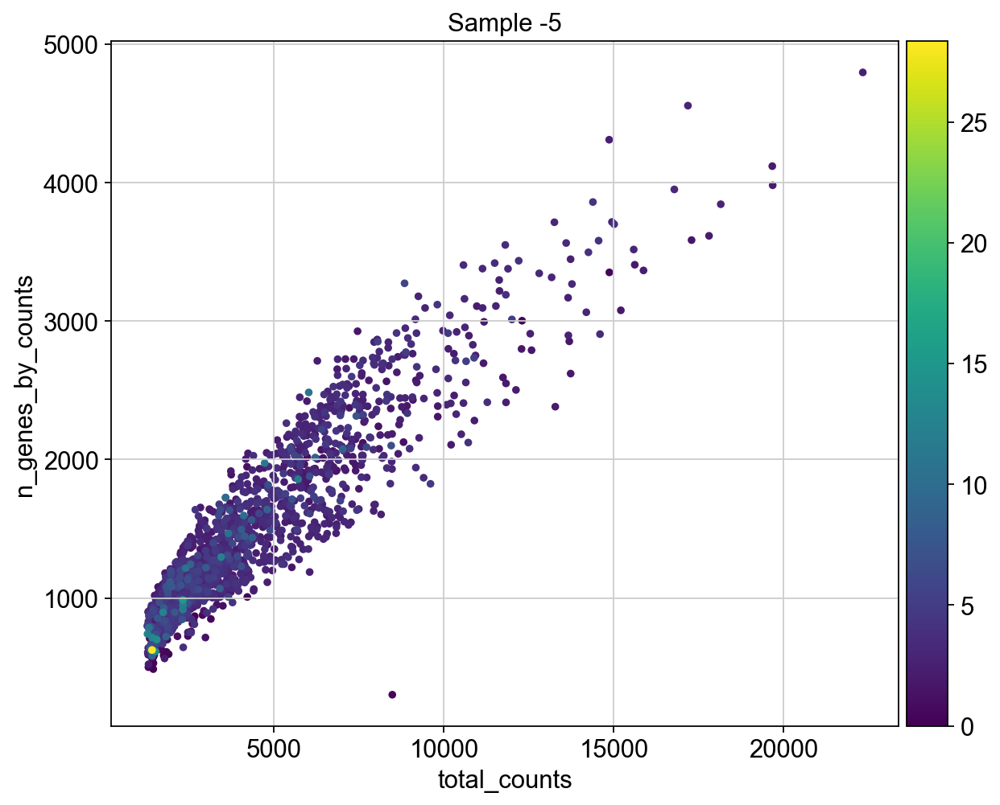

/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


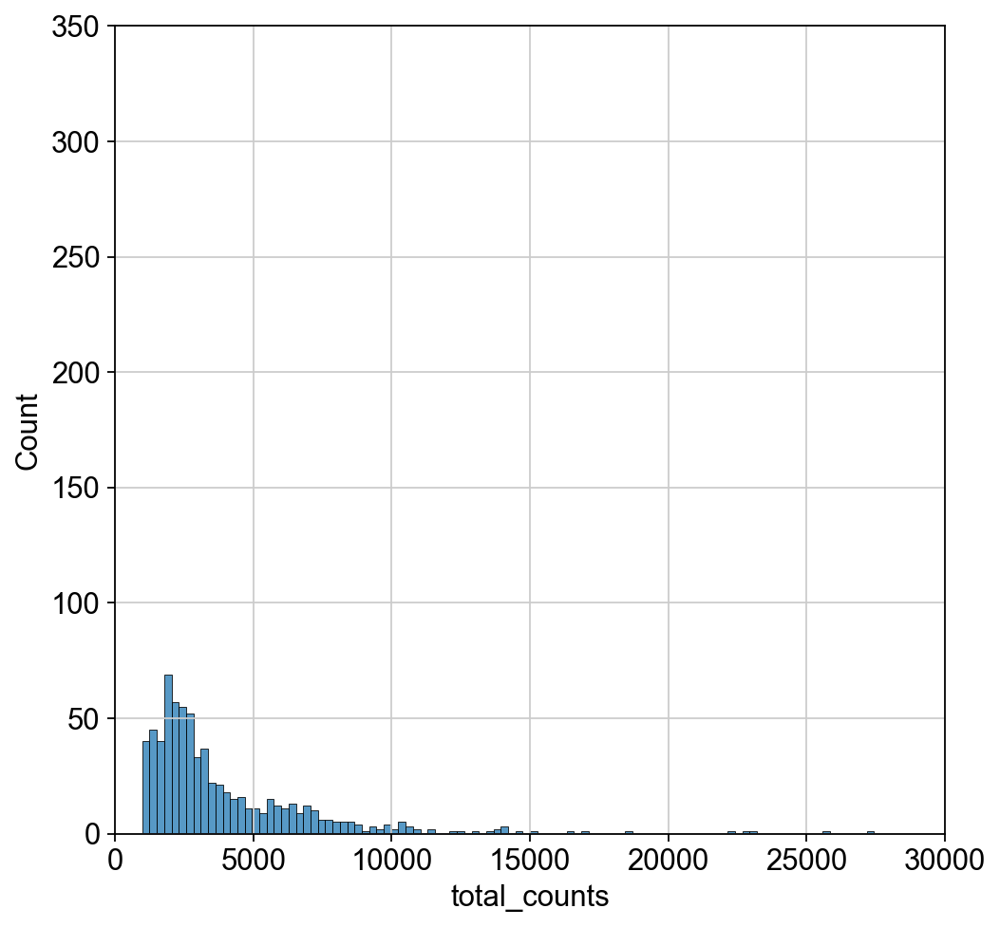

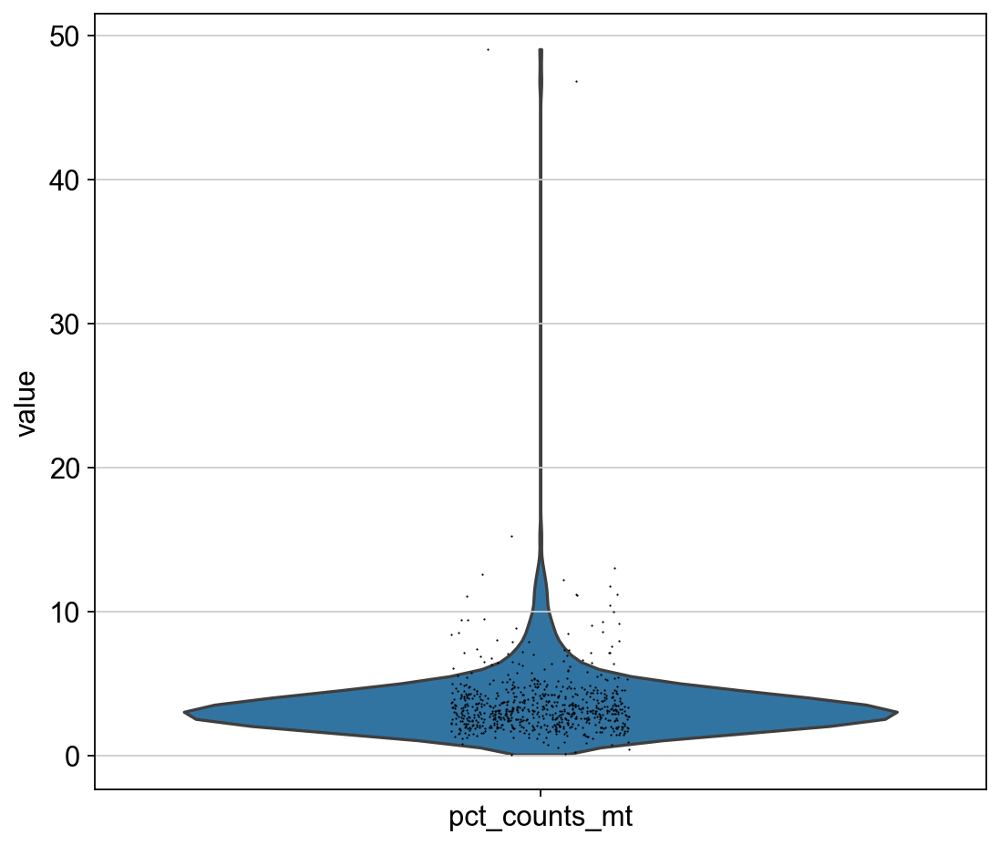

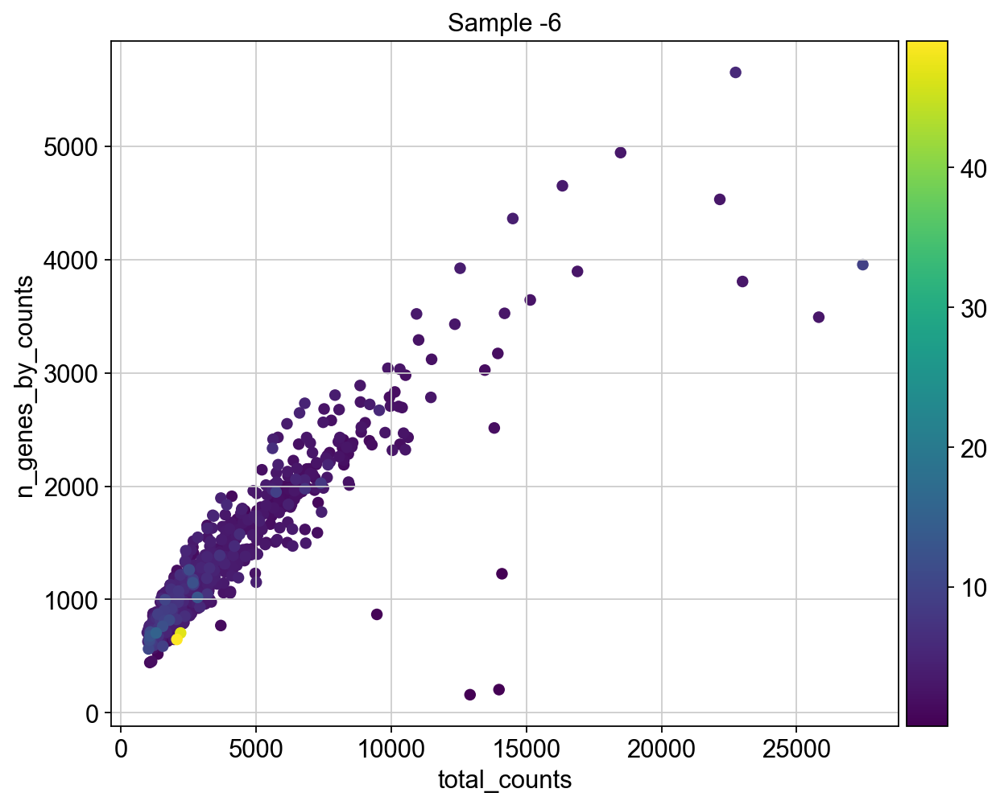

In [28]:
for x in samples: 
    subset_xie = xie_csv[xie_csv.obs.index.str.endswith(x)]
    p1 = sns.histplot(subset_xie.obs["total_counts"], bins=100, kde=False).set(xlim=(0,30000),ylim=(0,350))
    # sc.pl.violin(adata, 'total_counts')
    p2 = sc.pl.violin(subset_xie, "pct_counts_mt",title='Sample '+ x)
    p3 = sc.pl.scatter(subset_xie, "total_counts", "n_genes_by_counts", color="pct_counts_mt", title='Sample '+ x)
   
    

    

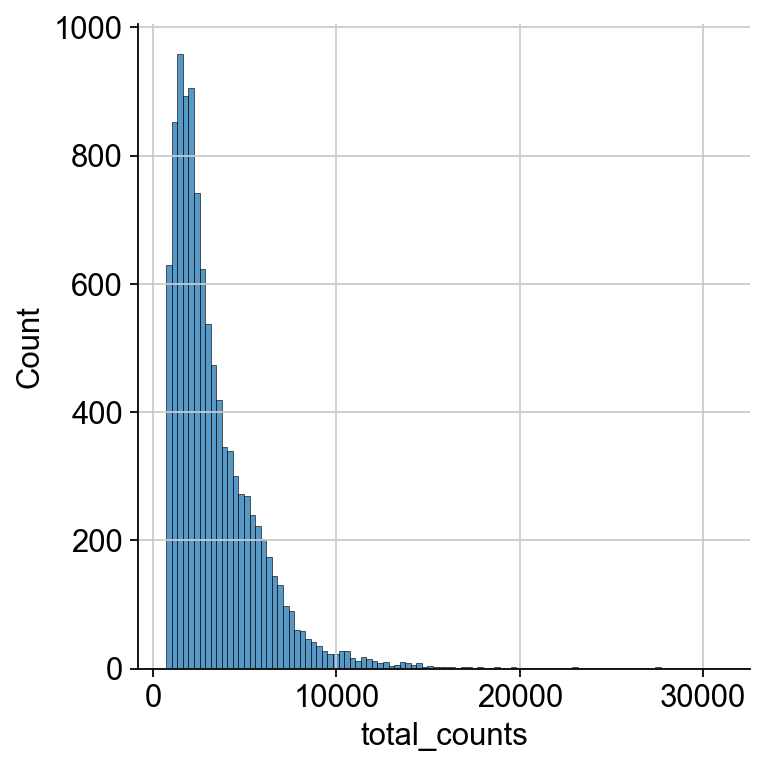

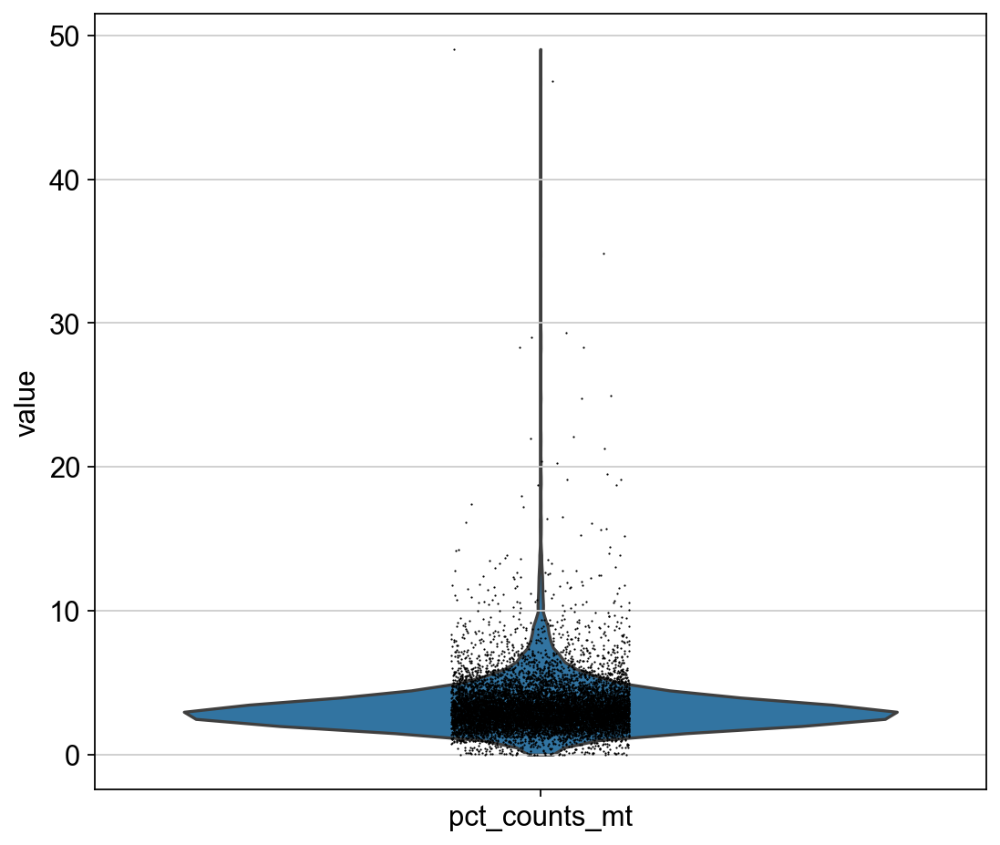

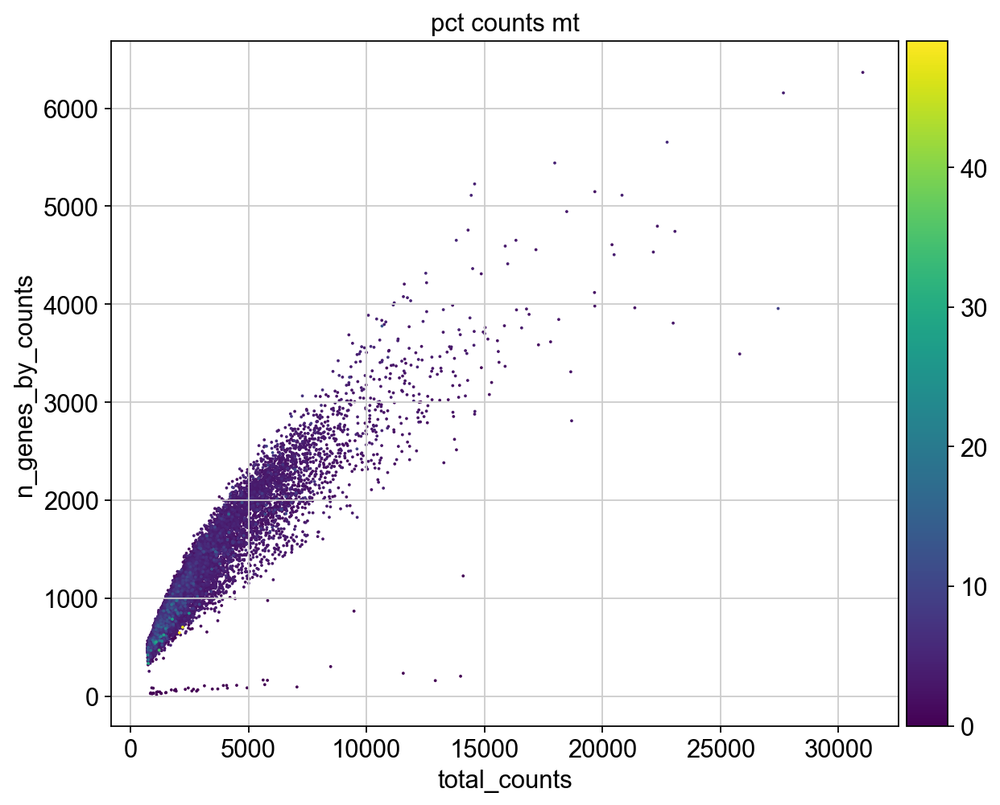

In [30]:
# plot the three QC covariates n_genes_by_counts, total_counts and pct_counts_mt per sample 
# to assess how well the respective cells were captured.
p1 = sns.displot(xie_csv.obs["total_counts"], bins=100, kde=False)
# sc.pl.violin(adata, 'total_counts')
p2 = sc.pl.violin(xie_csv, "pct_counts_mt")
p3 = sc.pl.scatter(xie_csv, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

[(10000.0, 20000.0), (0.0, 50.0)]

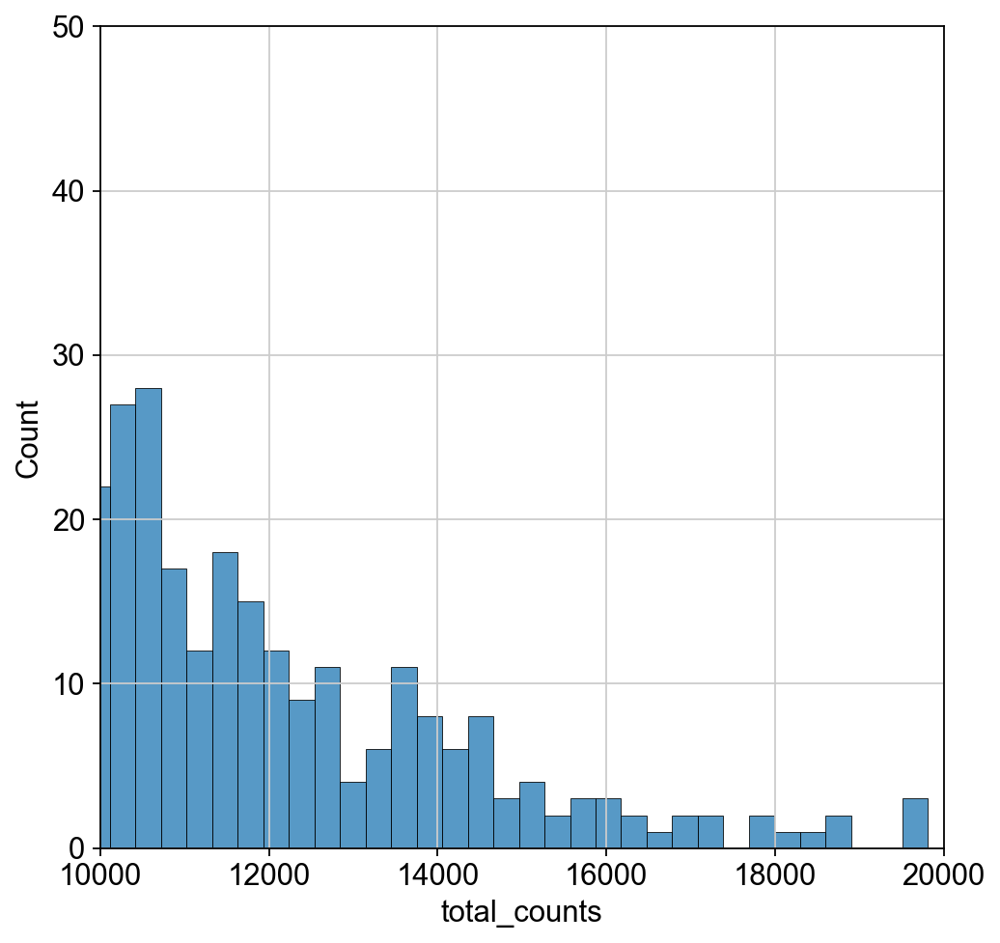

In [31]:
sns.histplot(
    xie_csv.obs, x="total_counts", bins=100, kde=False, legend = True
).set(xlim=(10000,20000), ylim=(0,50))

### comparison to Xie et al. 
xie et al paper: "Cells with percentage of reads mapped on mitochondrial genes > 15% or total number of genes expressed < 300 were removed from further analysis" --> 300 ✅, > 15% --> 30 obs - maybe even 8%? cells already dead? 

filter by:  min_genes=300, max_genes=4000, max_counts=17000
"Cells with a relatively high fraction of mitochondrial counts might for example be involved in respiratory processes and should not be filtered out."- SCBP

In [ ]:
# histogramm, bereich zw. 2000 6000, beim oberen: randbereiche genauer anschauen, 
# outliers mit high count and low numer of genes: population evtl genauer anschauen 

In [32]:
sc.pp.filter_cells(xie_csv, min_genes=300)
sc.pp.filter_cells(xie_csv, max_genes=4000)
sc.pp.filter_cells(xie_csv, max_counts=17000)

In [33]:
np.array(xie_csv.obs["pct_counts_mt"] > 15).sum()

30

In [34]:
np.array(xie_csv.obs["pct_counts_mt"] > 10).sum()

105

In [35]:
np.array(xie_csv.obs["pct_counts_mt"] > 8).sum()

229

In [31]:
print(f"Total number of cells: {xie_csv.n_obs}")

Total number of cells: 10410


In [34]:
np.array(xie_csv.obs["pct_counts_mt"] > 8).sum()

105

In [36]:
xie_csv.obs["mt_outlier"] = xie_csv.obs["pct_counts_mt"] > 8 #8 

In [37]:
xie_csv = xie_csv[(~xie_csv.obs.mt_outlier)].copy()

In [38]:
np.array(xie_csv.obs["pct_counts_mt"] > 8).sum()

0

### data after filtering low quality reads

In [39]:
print(f"Number of cells after filtering of low quality cells: {xie_csv.n_obs}")

Number of cells after filtering of low quality cells: 10100


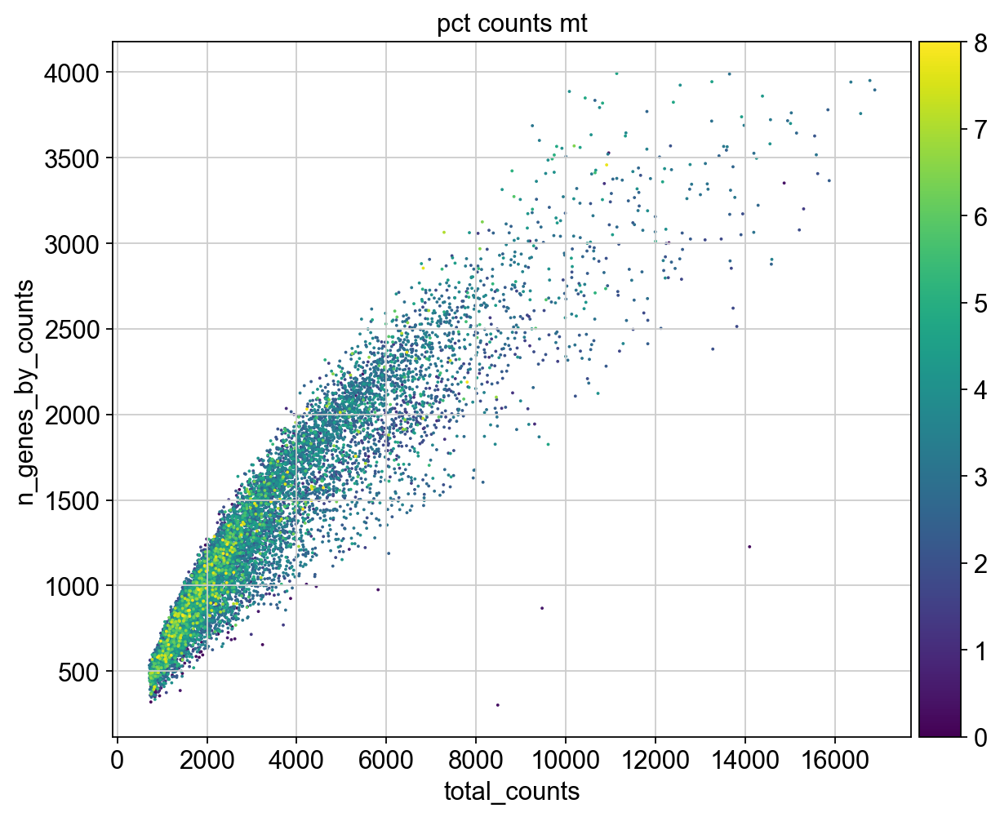

In [40]:
p1 = sc.pl.scatter(xie_csv, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [41]:
#xie_csv.write('/home/p/pohll/Desktop/MP/data/xie_leonie.h5ad')

In [2]:
xie = sc.read('/home/p/pohll/Desktop/MP/data/xie_leonie.h5ad')

In [4]:
import sys  
sys.path.insert(0, '/home/p/pohll/Desktop/Masterpraktikum/masterpraktikum_fibrosis_atlas/source')
#sys.path.append("Desktop/Masterpraktikum/masterpraktikum_fibrosis_atlas/source/utils.py")
import utils

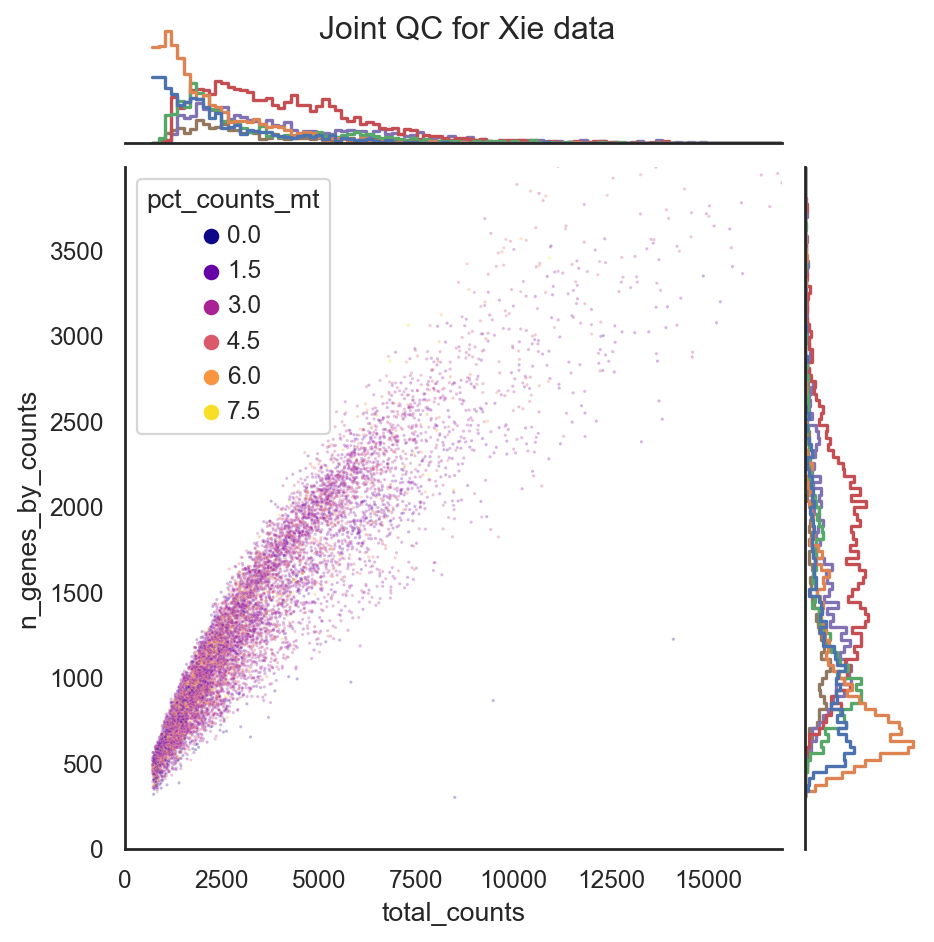

In [8]:
utils.plot_qc_joint(xie, x="total_counts",
                    y='n_genes_by_counts', 
                    hue='pct_counts_mt', 
                     palette='plasma',
                  marginal_hue="sample",
                    title='Joint QC for Xie data')

In [43]:
xie.n_obs

10100

## doublets analysis

In [44]:
%load_ext rpy2.ipython

In [45]:
%%R
library(Seurat)
library(scater)
library(scDblFinder)
library(BiocParallel)


    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

R[write to console]: Attaching SeuratObject

R[write to console]: Lade nötiges Paket: SingleCellExperiment

R[write to console]: Lade nötiges Paket: SummarizedExperiment

R[write to console]: Lade nötiges Paket: MatrixGenerics

R[write to console]: Lade nötiges Paket: matrixStats

R[write to console]: 
Attache Paket: ‘MatrixGenerics’


R[write to console]: Die folgenden Objekte sind maskiert von ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, ro

In [46]:
xie_mat = xie.X.T #input for scDblFinder

- `sce$scDblFinder.score` : the final doublet score (the higher the more likely that the cell is a doublet)
- `sce$scDblFinder.ratio` : the ratio of artificial doublets in the cell’s neighborhood
- `sce$scDblFinder.class` : the classification (doublet or singlet)

In [47]:
%%R -i xie_mat -o doublet_score -o doublet_class

set.seed(123)
sce = scDblFinder(
    SingleCellExperiment(
        list(counts=xie_mat),
    ) 
)
doublet_score = sce$scDblFinder.score
doublet_class = sce$scDblFinder.class

R[write to console]: dimnames(.) <- NULL translated to
dimnames(.) <- list(NULL,NULL)

R[write to console]: Creating ~6060 artificial doublets...

R[write to console]: Dimensional reduction

R[write to console]: Evaluating kNN...

R[write to console]: Training model...

R[write to console]: iter=0, 690 cells excluded from training.

R[write to console]: iter=1, 842 cells excluded from training.

R[write to console]: iter=2, 919 cells excluded from training.

R[write to console]: Threshold found:0.331

R[write to console]: 932 (9.2%) doublets called



In [48]:
xie.obs["scDblFinder_score"] = doublet_score
xie.obs["scDblFinder_class"] = doublet_class
xie.obs.scDblFinder_class.value_counts()

scDblFinder_class
singlet    9168
doublet     932
Name: count, dtype: int64

9293 singlets, 933 doublets, leave doublets in for now 

In [49]:
xie

AnnData object with n_obs × n_vars = 10100 × 27998
    obs: 'annotation', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'sample', 'n_genes', 'n_counts', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

In [50]:
xie.write('/home/p/pohll/Desktop/MP/data/xie_leonie.h5ad')

# Normalization 

In [51]:
scales_counts = sc.pp.normalize_total(xie, target_sum=None, inplace=False)
# log1p transform
xie.layers["log1p_norm"] = sc.pp.log1p(scales_counts["X"], copy=True)

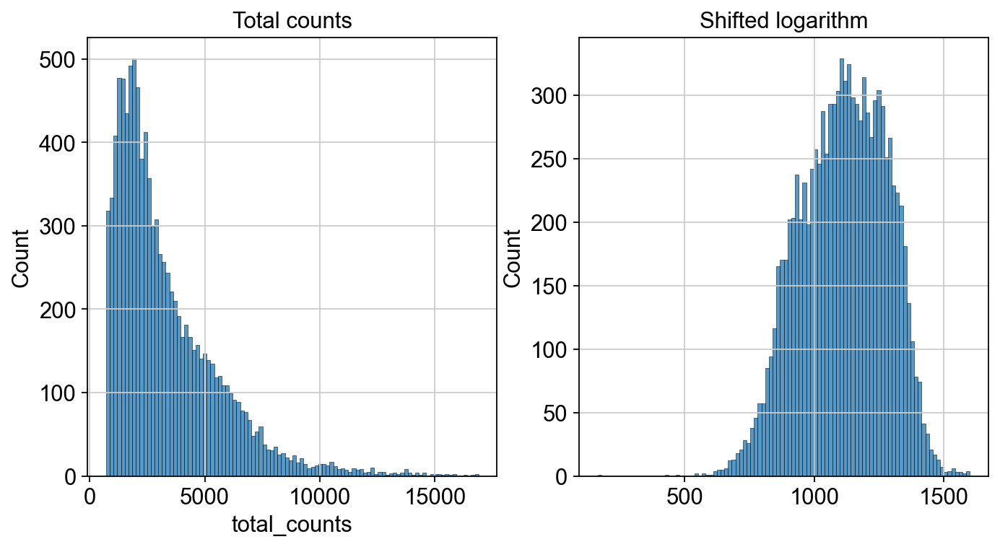

In [52]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
p1 = sns.histplot(xie.obs["total_counts"], bins=100, kde=False, ax=axes[0])
axes[0].set_title("Total counts")
p2 = sns.histplot(xie.layers["log1p_norm"].sum(1), bins=100, kde=False, ax=axes[1])
axes[1].set_title("Shifted logarithm")
plt.show()

In [53]:
xie

AnnData object with n_obs × n_vars = 10100 × 27998
    obs: 'annotation', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'sample', 'n_genes', 'n_counts', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'log1p_norm'

# Feature Selection 
exclude uninformative genes
- use deviance for feature selection which works on raw counts. 
- can be computed in closed form and quantifies whether genes show a constant expression profile across cells as these are not informative
- Genes with constant expression: multinomial null model
- Highly informative genes across cells: high deviance value, do not fit null model 
- According to the deviance values, the method then ranks all genes and obtains only highly deviant genes.

## 1. using scry --> eher nicht

In [5]:
sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    frameon=False,
)

rcb.logger.setLevel(logging.ERROR)
ro.pandas2ri.activate()
anndata2ri.activate()

In [6]:
load_ext rpy2.ipython

In [7]:
%%R
library(scry)

save the AnnData object in our R environment

In [8]:
ro.globalenv["xie"] = xie

In [26]:
#%%R -i xie
#xie

NotImplementedError: Conversion 'py2rpy' not defined for objects of type '<class 'anndata._core.anndata.AnnData'>'

In [9]:
%%R
sce = devianceFeatureSelection(xie, assay="X")

In [10]:
binomial_deviance = ro.r("rowData(sce)$binomial_deviance").T

sort the vector an select the top 4,000 highly deviant genes and save them as an additional column in .var as ‘highly_deviant’. 
save the computed binomial deviance in case we want to sub-select a different number of highly variable genes afterwards.

In [11]:
idx = binomial_deviance.argsort()[-4000:]
mask = np.zeros(xie.var_names.shape, dtype=bool)
mask[idx] = True

xie.var["highly_deviant"] = mask
xie.var["binomial_deviance"] = binomial_deviance

In [12]:
xie.var["highly_deviant"].value_counts()

highly_deviant
False    23998
True      4000
Name: count, dtype: int64

In [13]:
# setting highly variable as highly deviant to use scanpy 'use_highly_variable' argument in sc.pp.pca
xie.var["highly_variable"] = xie.var["highly_deviant"]

In [18]:
#xie.X = xie.layers["log1p_norm"]

## 2. Using sc.pp.highly_variable_genes

In [54]:
sc.pp.log1p(xie)

In [64]:
sc.pp.highly_variable_genes(xie, min_mean=0.0120, max_mean=3, min_disp=0.5)

In [65]:
sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    frameon=False,
)

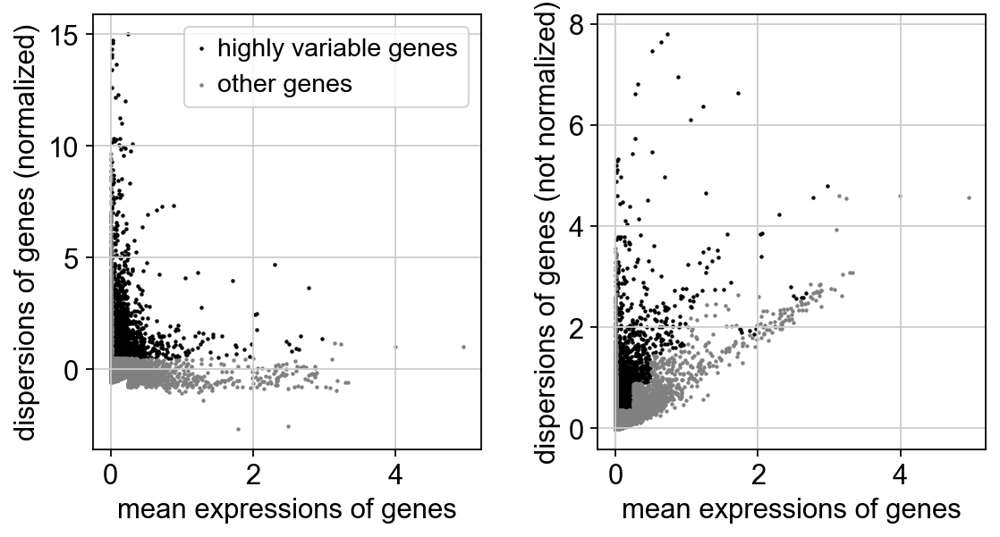

In [66]:
sc.pl.highly_variable_genes(xie)

In [67]:
xie

AnnData object with n_obs × n_vars = 10100 × 27998
    obs: 'annotation', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'sample', 'n_genes', 'n_counts', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'log1p_norm'

# Dim Reduction + UMAP

## 1. PCA 

In [68]:
sc.tl.pca(xie, svd_solver='arpack', use_highly_variable=True )

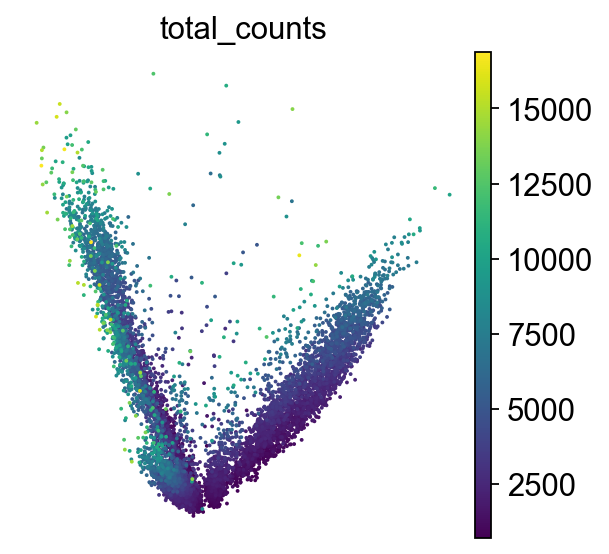

In [69]:
sc.pl.pca(xie, color='total_counts')

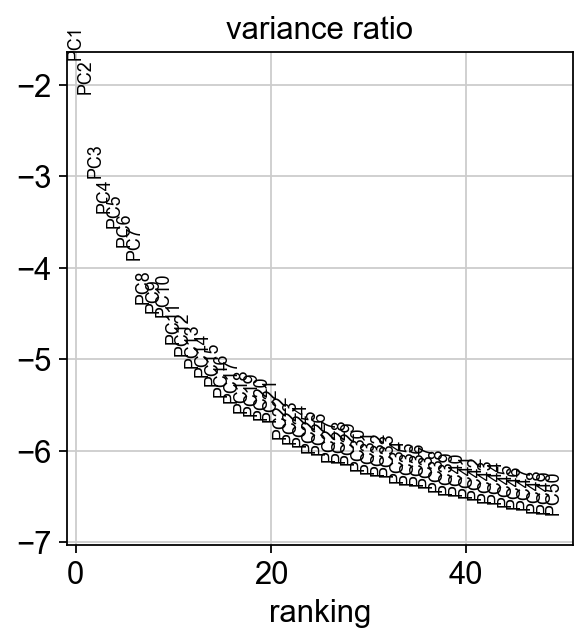

In [71]:
sc.pl.pca_variance_ratio(xie, log=True, n_pcs = 50) # später rufer neighbours/UMAP mit verschiedenen PCs auf 

## 2. UMAP

In [78]:
sc.pp.neighbors(xie,n_pcs = 30, n_neighbors = 20) 
sc.tl.umap(xie)

In [86]:
plt.rcParams['figure.figsize'] = (7, 7)

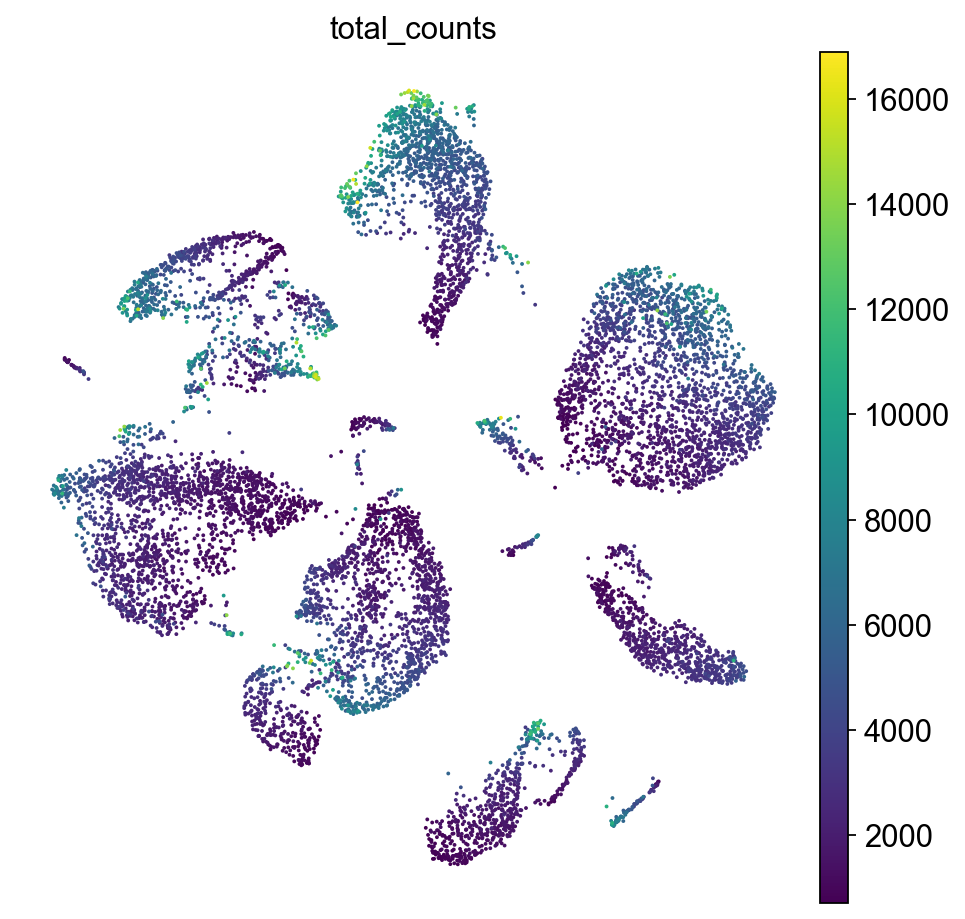

In [87]:
sc.pl.umap(xie, color="total_counts")

/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


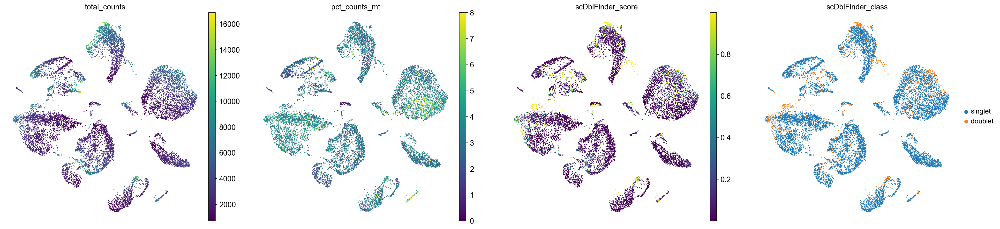

In [88]:
sc.pl.umap(
    xie,
    color=["total_counts", "pct_counts_mt", "scDblFinder_score", "scDblFinder_class"],
)
# todo doublets + hohe counts nochmal anschaune --> rausfiltern

In [89]:
xie.write('/home/p/pohll/Desktop/MP/data/xie_leonie.h5ad')

## Filtering out doublets 

In [125]:
xie_filtered_doublet = xie.copy()

In [129]:
mask = (xie_filtered_doublet.obs['scDblFinder_class'] != 2) & (xie_filtered_doublet.obs['scDblFinder_score'] <= 0.9) & (xie_filtered_doublet.obs['total_counts'] <= 12000)


In [132]:
filtered_obs = xie_filtered_doublet.obs[mask]

# Filter the AnnData object using the mask
xie_filtered_doublet = xie_filtered_doublet[mask]

# Update the AnnData object with the filtered `obs`
xie_filtered_doublet.obs = filtered_obs

In [135]:
xie_filtered_doublet.obs.shape

(9278, 20)

In [143]:
xie_filtered_doublet

AnnData object with n_obs × n_vars = 9278 × 27998
    obs: 'annotation', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'n_counts', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_deviant', 'binomial_deviance', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'log1p_norm'
    obsp: 'distances', 'connectivities'

In [136]:
xie.obs.shape

(10226, 20)

In [138]:
sc.pp.log1p(xie_filtered_doublet)

In [139]:
sc.tl.pca(xie_filtered_doublet, svd_solver='arpack', use_highly_variable=True )

In [140]:
sc.pp.neighbors(xie_filtered_doublet)
sc.tl.umap(xie_filtered_doublet)

/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


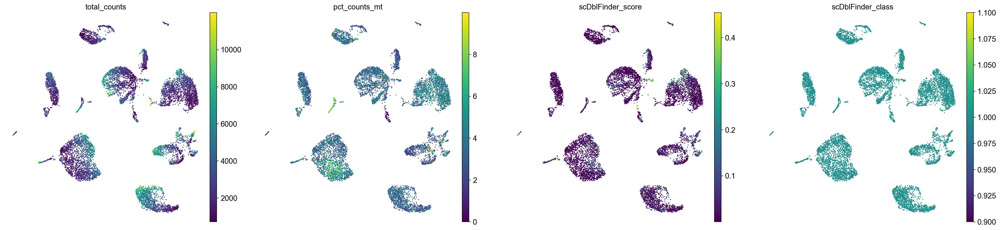

In [141]:
sc.pl.umap(
    xie_filtered_doublet,
    color=["total_counts", "pct_counts_mt", "scDblFinder_score", "scDblFinder_class"],
)


In [142]:
xie_filtered_doublet.write('/home/p/pohll/Desktop/MP/data/xie_leonie_filtered.h5ad')

# Analyze Batch effects

In [93]:
xie.obs['sample']=xie.obs.index.str.split('-').str[1]
xie.obs['cond']='control'
xie.obs.loc[xie.obs['sample'].isin(['4', '5', '6']), 'cond']='bleo'

/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


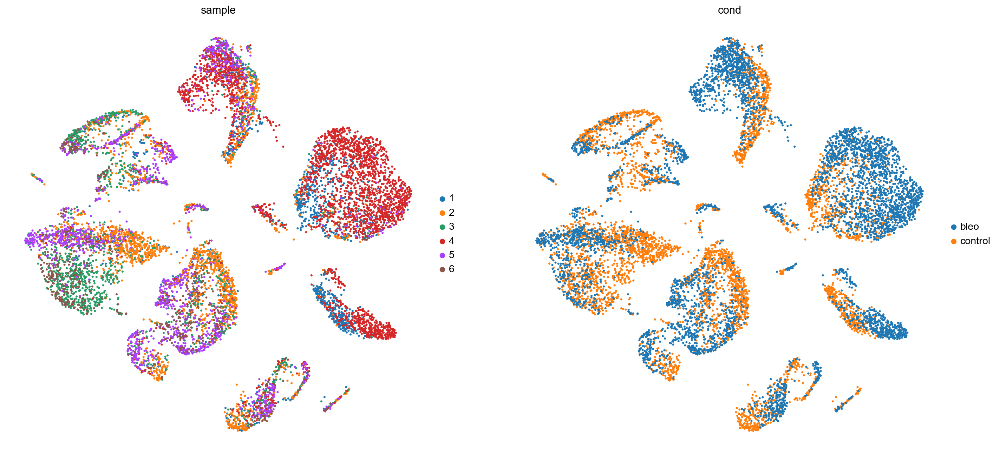

In [94]:
plt.rcParams['figure.figsize'] = (10, 10)
sc.pl.umap(xie, color=['sample', 'cond'], size=30)

- fewer contol cells than bleo cells, makes sense since in total 1943 (normal)+ 3386 (fibrotic) cells. 
- batch effect: each batch only "represents" one condition - bleo or normal 

/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


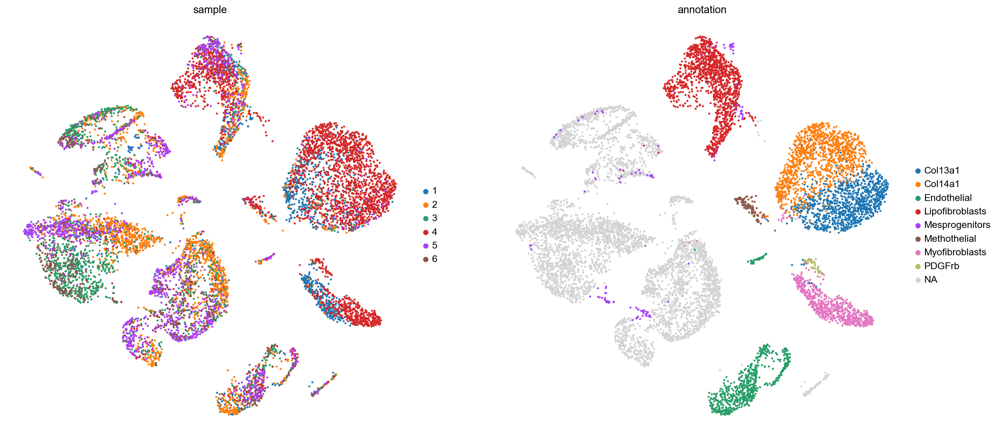

In [96]:
plt.rcParams['figure.figsize'] = (10, 10)
sc.pl.umap(xie, color=['sample',"annotation"], size=30)

-  cells from same label are generally near each other
- but shift between batches. 